This notebook needs the following python packages:

pip3 install opencv-python==4.4.0.42 opencv-contrib-python matplotlib


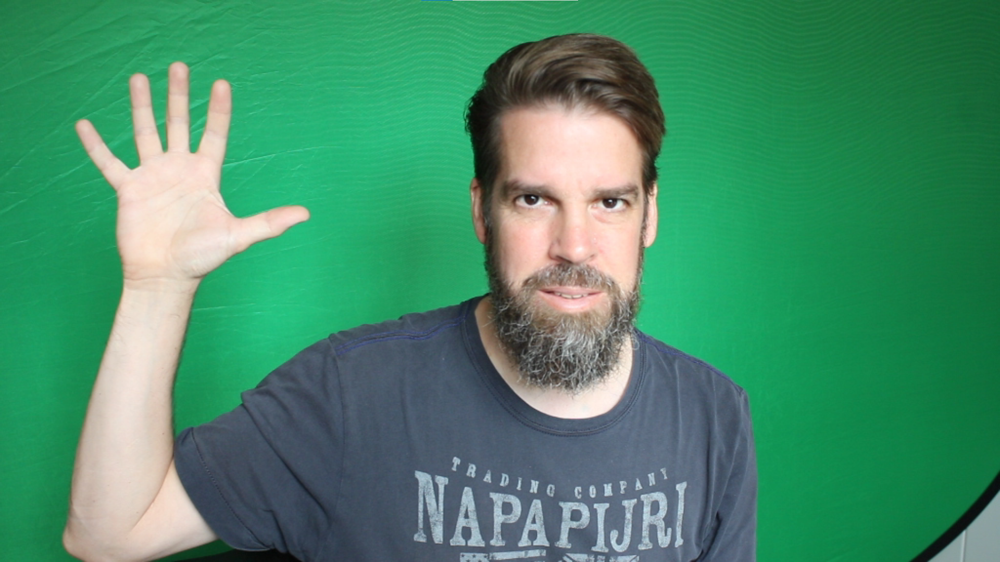

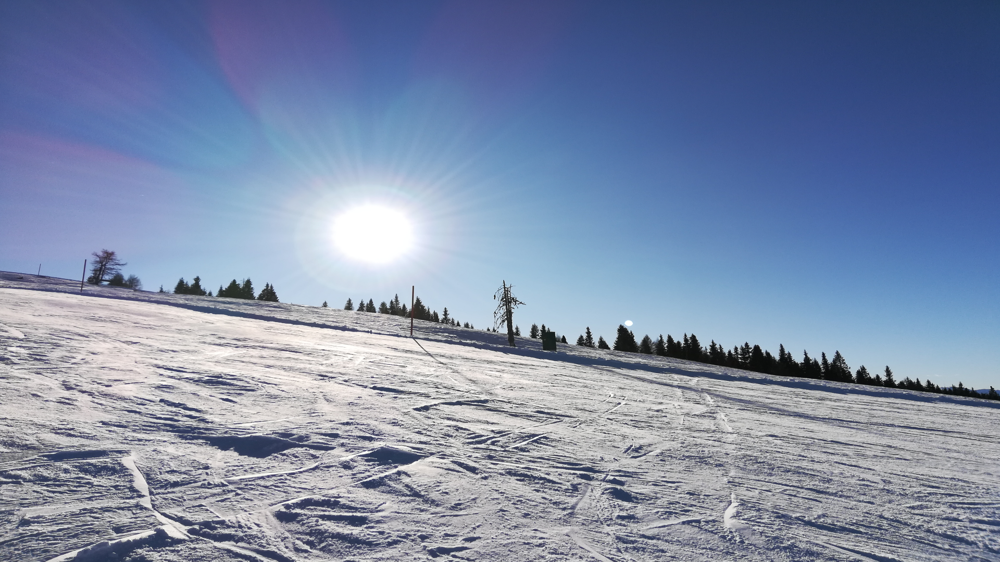

In [10]:
import cv2  
import numpy as np  
# to output something in jupyter
from IPython.display import display
from PIL import Image
# to output histograms
import matplotlib.pyplot as plt

def show(imageToShow):
    imageRGB = cv2.cvtColor(imageToShow, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(imageRGB))
    
# load test image and background
frame = cv2.imread("Training-main.png") 
background = cv2.imread("IMG_20200105_133115.jpg") 

# resize both to be the same size
frame = cv2.resize(frame, (1920, 1080)) 
background = cv2.resize(background, (1920, 1080), interpolation=cv2.INTER_AREA) 
  
show(frame)
show(background)

'threshold = 4080.21'

'start 5'

'end 22'

'start 30'

'end 31'

'start 70'

'end 79'

'start 100'

'end 112'

75

408021

70

79

Text(0.5, 1.0, 'Value Image')

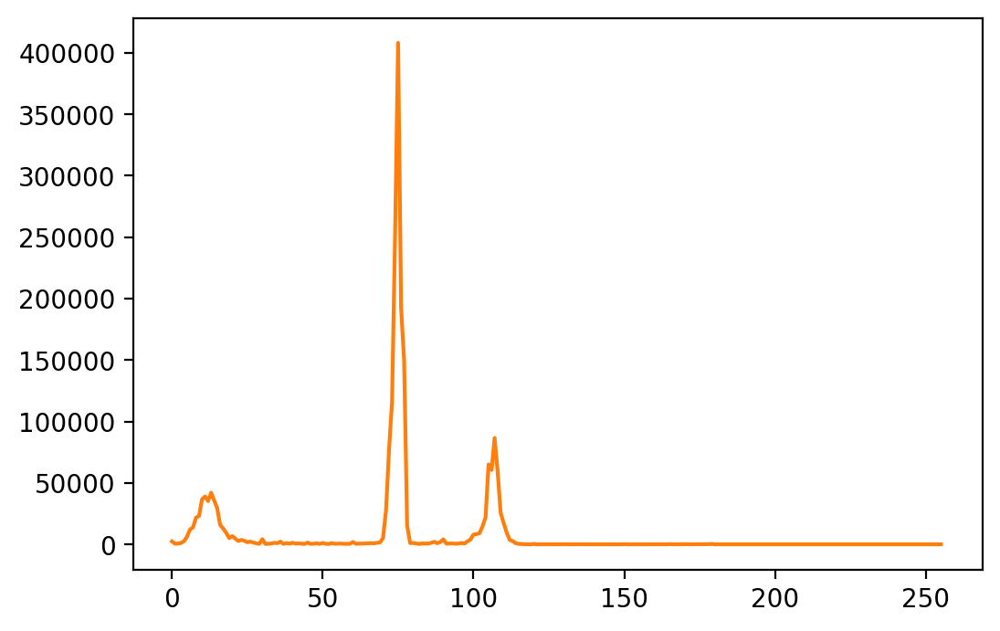

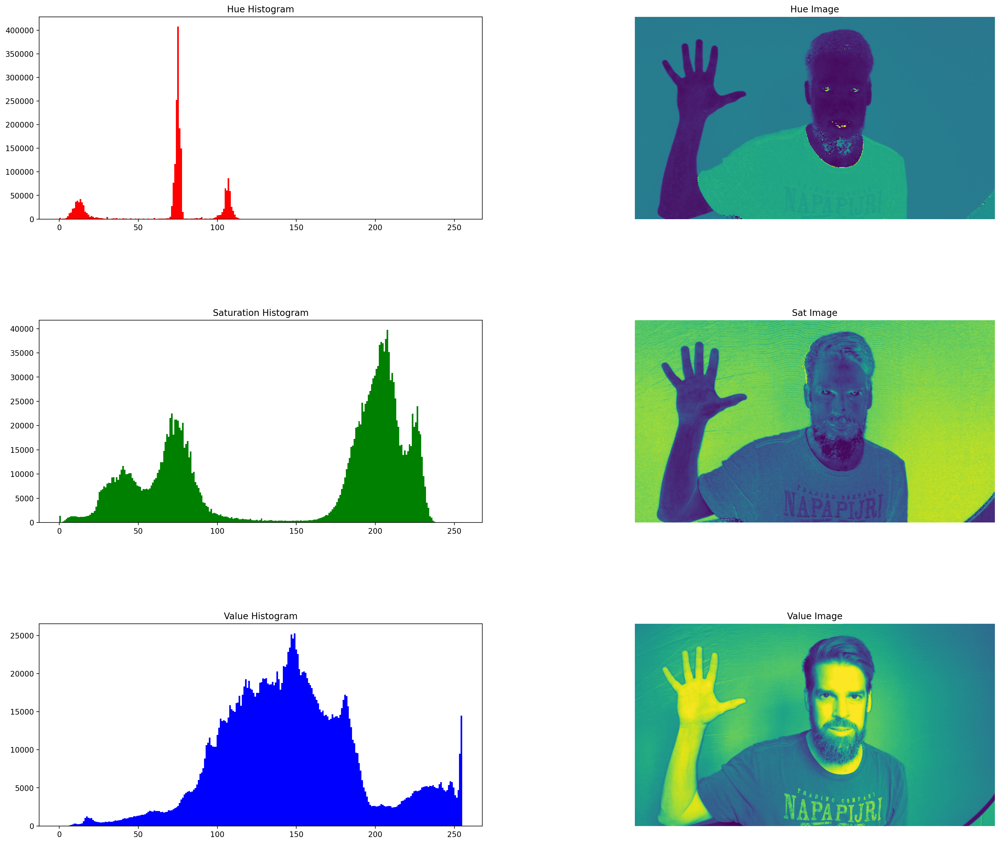

In [11]:
# the hsv space helps us to create a better mask
hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

h = hsv[:, :, 0]
s = hsv[:, :, 1]
v = hsv[:, :, 2]

hist = np.histogram(h, bins=256, range=(0, 255))
maxx=0
maxy=0
x=0
for y in hist[0]:
    if y>maxy:
        maxy=y
        maxx=x
    x=x+1
x=0
lasty=0
threshold=(maxy*0.01)
display("threshold = "+str(threshold))
start = 0
end = 0
for y in hist[0]:
    if (y>threshold and lasty<threshold):
        display("start "+str(x))
        if (end==0):
            start = x
    if (y<threshold and lasty>threshold):
        display("end "+str(x))
        if (end == 0 and start<=maxx and x>=maxx):
            end = x
    lasty = y
    x=x+1
display(maxx)
display(maxy)
display(start)
display(end)
plt.plot(256,4000,hist[0])

# setup size of plot
plt.rcParams['figure.dpi'] = 200
plt.figure(figsize=(24,20))
plt.subplots_adjust(hspace=0.5, wspace=0.25)

plt.subplot(3, 2, 1)
plt.hist(h.ravel(), bins=256, range=(0, 255), color='r')
plt.title('Hue Histogram')

plt.subplot(3, 2, 2)
plt.imshow(h)
plt.axis('off')
plt.title('Hue Image')

plt.subplot(3, 2, 3)
plt.hist(s.ravel(), bins=256, range=(0, 255), color='g')
plt.title('Saturation Histogram')

plt.subplot(3, 2, 4)
plt.imshow(s)
plt.axis('off')
plt.title('Sat Image')

plt.subplot(3, 2, 5)
plt.hist(v.ravel(), bins=256, range=(0, 255), color='b')
plt.title('Value Histogram')

plt.subplot(3, 2, 6)
plt.imshow(v)
plt.axis('off')
plt.title('Value Image')


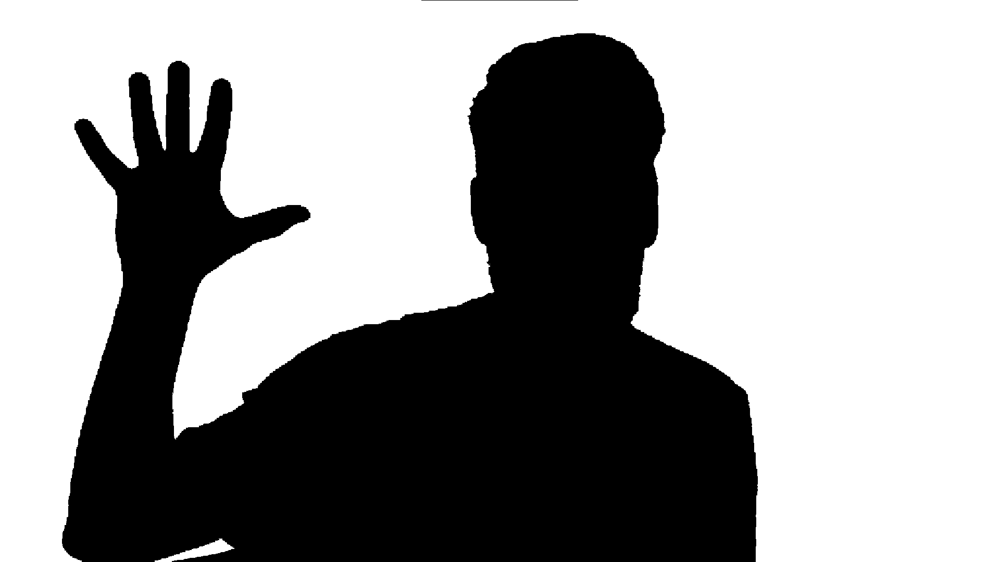

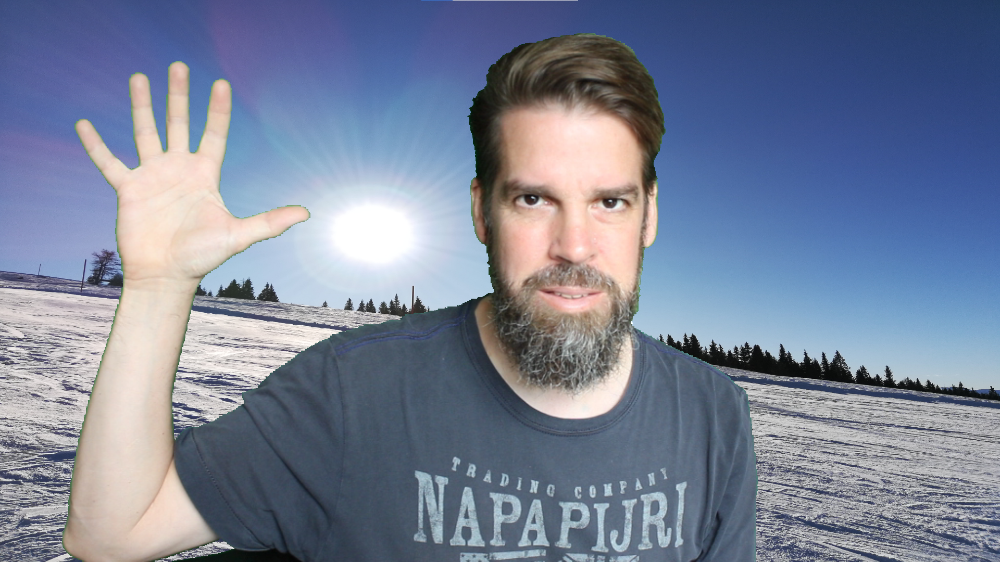

In [12]:
l_green = np.array([start-4, 50, 50]) 
u_green = np.array([end+4, 255, 255]) 

mask = cv2.inRange(hsv, l_green, u_green) 

# greenscreen is not perfect - it doesn't fill the corners
# so let's fix the mask by filling the one corner left open
height, width = frame.shape[:2]
fillmask = np.zeros((height + 2, width + 2), np.uint8)
frame = frame.astype("uint8")
cv2.floodFill(mask, fillmask, (1919, 1079), 255)

show(mask)
res = cv2.bitwise_and(frame, frame, mask = mask) 
  
f = frame - res 
f = np.where(f == 0, background, f) 

# now resize the resulting image to a fifth of the original image
#f = cv2.resize(f, (int(1920/5), int(1080/5)), interpolation=cv2.INTER_AREA) 

show(f)

